### Text Classification with NLTK


## Text Classification is the process of assigning a label or category to a given piece of text. For example, we can classify emails as spam or not spam, tweets as positive or negative, and articles as relevant or not relevant to a given topic.




### Let us take an example: 

- I am happy with your response 
- I am not satisfied with your feedback
- I am ok with this situation 

## Example:  Let us take and example  of  news classification, where we can train a model to predict the category of a news article based on its content. Here’s an example of how to do this using scikit-learn:

In [5]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
import pandas as pd

# Load the dataset
news = pd.read_csv('newss.csv')


In [6]:
news.head()

,title,text,category
0,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


In [7]:
news = news.dropna(how='any',axis=0)

In [8]:
news.head()

,title,text,category
0,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


In [9]:
# Split the data into training and testing sets
from sklearn.model_selection import train_test_split  
X_train, X_test, y_train, y_test = train_test_split(news['text'], news['category'], test_size=0.2)

# Create a TfidfVectorizer to convert text to numerical features
vectorizer = TfidfVectorizer()
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

# Train a logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Evaluate the model on the test set
score = model.score(X_test, y_test)
print('Accuracy:', score)

Accuracy: 0.9059304703476483


In [12]:
y_pred=model.predict(X_test)

In [13]:
# import the metrics class
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[228,  17],
       [ 29, 215]], dtype=int64)

Text(0.5, 257.44, 'Predicted label')

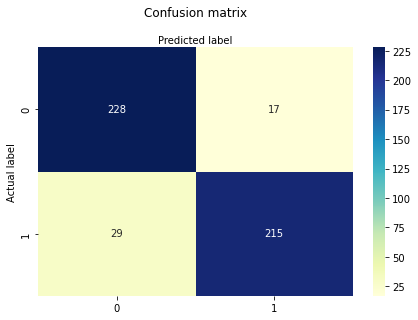

In [14]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import pie, axis, show
%matplotlib inline
import numpy as np
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

## Conclusion
- We have more positive instances as compared to negative
- 91% Prediction will be correct for News Category

## Movies Review Data from Nltk Corpus

In [7]:
import nltk
import random
from nltk.corpus import movie_reviews 

documents = [(list(movie_reviews.words(fileid)), category)
             for category in movie_reviews.categories()
             for fileid in movie_reviews.fileids(category)]

random.shuffle(documents)

#print(documents[1])

all_words = []
for w in movie_reviews.words():
    all_words.append(w.lower())

all_words = nltk.FreqDist(all_words)
print(all_words.most_common(15))
#print(all_words["poor"])

[(',', 77717), ('the', 76529), ('.', 65876), ('a', 38106), ('and', 35576), ('of', 34123), ('to', 31937), ("'", 30585), ('is', 25195), ('in', 21822), ('s', 18513), ('"', 17612), ('it', 16107), ('that', 15924), ('-', 15595)]


In [8]:
print(all_words["poor"])

219


In [9]:
#print(all_words.most_common(15))
print(all_words["brain"])

93


In [10]:
len(all_words)

39768

In [11]:
word_features = list(all_words.keys())[:300]
word_features 

['plot',
 ':',
 'two',
 'teen',
 'couples',
 'go',
 'to',
 'a',
 'church',
 'party',
 ',',
 'drink',
 'and',
 'then',
 'drive',
 '.',
 'they',
 'get',
 'into',
 'an',
 'accident',
 'one',
 'of',
 'the',
 'guys',
 'dies',
 'but',
 'his',
 'girlfriend',
 'continues',
 'see',
 'him',
 'in',
 'her',
 'life',
 'has',
 'nightmares',
 'what',
 "'",
 's',
 'deal',
 '?',
 'watch',
 'movie',
 '"',
 'sorta',
 'find',
 'out',
 'critique',
 'mind',
 '-',
 'fuck',
 'for',
 'generation',
 'that',
 'touches',
 'on',
 'very',
 'cool',
 'idea',
 'presents',
 'it',
 'bad',
 'package',
 'which',
 'is',
 'makes',
 'this',
 'review',
 'even',
 'harder',
 'write',
 'since',
 'i',
 'generally',
 'applaud',
 'films',
 'attempt',
 'break',
 'mold',
 'mess',
 'with',
 'your',
 'head',
 'such',
 '(',
 'lost',
 'highway',
 '&',
 'memento',
 ')',
 'there',
 'are',
 'good',
 'ways',
 'making',
 'all',
 'types',
 'these',
 'folks',
 'just',
 'didn',
 't',
 'snag',
 'correctly',
 'seem',
 'have',
 'taken',
 'pretty',


In [12]:
## Converting Words to features 
random.shuffle(documents)

all_words = []

for w in movie_reviews.words():
    all_words.append(w.lower())

all_words = nltk.FreqDist(all_words)

word_features = list(all_words.keys())[:300]

def find_features(document):
    words = set(document)
    features = {}
    for w in word_features:
        features[w] = (w in words)

    return features
print((find_features(movie_reviews.words('neg/cv000_29416.txt'))))

{'plot': True, ':': True, 'two': True, 'teen': True, 'couples': True, 'go': True, 'to': True, 'a': True, 'church': True, 'party': True, ',': True, 'drink': True, 'and': True, 'then': True, 'drive': True, '.': True, 'they': True, 'get': True, 'into': True, 'an': True, 'accident': True, 'one': True, 'of': True, 'the': True, 'guys': True, 'dies': True, 'but': True, 'his': True, 'girlfriend': True, 'continues': True, 'see': True, 'him': True, 'in': True, 'her': True, 'life': True, 'has': True, 'nightmares': True, 'what': True, "'": True, 's': True, 'deal': True, '?': True, 'watch': True, 'movie': True, '"': True, 'sorta': True, 'find': True, 'out': True, 'critique': True, 'mind': True, '-': True, 'fuck': True, 'for': True, 'generation': True, 'that': True, 'touches': True, 'on': True, 'very': True, 'cool': True, 'idea': True, 'presents': True, 'it': True, 'bad': True, 'package': True, 'which': True, 'is': True, 'makes': True, 'this': True, 'review': True, 'even': True, 'harder': True, 'wri

In [13]:
##Then we can do this for all of our documents, saving the feature existence booleans 
## and their respective positive or negative categories by doing:

featuresets = [(find_features(rev), category) for (rev, category) in documents]
featuresets


[({'plot': False,
   ':': True,
   'two': True,
   'teen': False,
   'couples': False,
   'go': False,
   'to': True,
   'a': True,
   'church': False,
   'party': False,
   ',': True,
   'drink': False,
   'and': True,
   'then': False,
   'drive': False,
   '.': True,
   'they': True,
   'get': False,
   'into': True,
   'an': True,
   'accident': False,
   'one': True,
   'of': True,
   'the': True,
   'guys': False,
   'dies': False,
   'but': True,
   'his': True,
   'girlfriend': False,
   'continues': False,
   'see': True,
   'him': True,
   'in': True,
   'her': False,
   'life': False,
   'has': True,
   'nightmares': False,
   'what': True,
   "'": True,
   's': True,
   'deal': False,
   '?': False,
   'watch': False,
   'movie': False,
   '"': True,
   'sorta': False,
   'find': False,
   'out': True,
   'critique': False,
   'mind': False,
   '-': True,
   'fuck': False,
   'for': True,
   'generation': False,
   'that': True,
   'touches': False,
   'on': True,
   'very'

## Naive Bayes classifiers
In machine learning, naive Bayes classifiers are a family of simple "probabilistic classifiers" based on applying Bayes' theorem with strong (naive) independence assumptions between the features.

## Constructing classifiers
Models that assign class labels to problem instances, represented as vectors of feature values, where the class labels are drawn from some finite set.

In [14]:
# set that we'll train our classifier with
training_set = featuresets[:1900]

# set that we'll test against.
testing_set = featuresets[1900:]

In [15]:
training_set

[({'plot': False,
   ':': True,
   'two': True,
   'teen': False,
   'couples': False,
   'go': False,
   'to': True,
   'a': True,
   'church': False,
   'party': False,
   ',': True,
   'drink': False,
   'and': True,
   'then': False,
   'drive': False,
   '.': True,
   'they': True,
   'get': False,
   'into': True,
   'an': True,
   'accident': False,
   'one': True,
   'of': True,
   'the': True,
   'guys': False,
   'dies': False,
   'but': True,
   'his': True,
   'girlfriend': False,
   'continues': False,
   'see': True,
   'him': True,
   'in': True,
   'her': False,
   'life': False,
   'has': True,
   'nightmares': False,
   'what': True,
   "'": True,
   's': True,
   'deal': False,
   '?': False,
   'watch': False,
   'movie': False,
   '"': True,
   'sorta': False,
   'find': False,
   'out': True,
   'critique': False,
   'mind': False,
   '-': True,
   'fuck': False,
   'for': True,
   'generation': False,
   'that': True,
   'touches': False,
   'on': True,
   'very'

In [16]:
## define, and train our classifier like:

classifier = nltk.NaiveBayesClassifier.train(training_set)

In [17]:
print("Classifier accuracy percent:",(nltk.classify.accuracy(classifier, testing_set))*100)

Classifier accuracy percent: 78.0


In [18]:
## what the most valuable words are when it comes to positive or negative reviews:

classifier.show_most_informative_features(5)

Most Informative Features
                 unravel = True              pos : neg    =      5.6 : 1.0
                 jumbled = True              neg : pos    =      3.8 : 1.0
                   kudos = True              pos : neg    =      3.8 : 1.0
                    mess = True              neg : pos    =      3.7 : 1.0
                 chopped = True              neg : pos    =      3.0 : 1.0


## Pickle module:  
To go ahead and serialize our classifier object, so that all we need to do is load that file in real quick


In [19]:
import pickle
save_classifier = open("naivebayes.pickle","wb")
pickle.dump(classifier, save_classifier)
save_classifier.close()

- This opens up a pickle file, preparing to write in bytes some data. Then, we use pickle.dump() to dump the data. The first parameter to pickle.dump() is what are you dumping, the second parameter is where are you dumping it.
- The .pickle file is a serialized object, all we need to do now is read it into memory, which will be about as quick as reading any other ordinary file. 

In [20]:

classifier_f = open("naivebayes.pickle", "rb")
classifier = pickle.load(classifier_f)
classifier_f.close()

- Now, we can use this object, and we no longer need to train our classifier every time we wanted to use it to classify.

## Scikit-Learn Sklearn with NLTK

In [21]:
from nltk.classify.scikitlearn import SklearnClassifier


#### The multinomial Naive Bayes classifier is suitable for classification with discrete features (e.g., word counts for text classification). The multinomial distribution normally requires integer feature counts. However, in practice, fractional counts such as tf-idf may also work.

In [22]:
import numpy as np
X = np.random.randint(5, size=(9, 100))
y = np.array([0,1, 2, 3, 4,5,6,7,8])
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB()
clf.fit(X, y)
print(clf.predict(X[6:8]))


[6 7]


In [23]:
## From here, you can use just about any of the sklearn classifiers. For example, lets bring in a couple more variations of the Naive Bayes algorithm:

from sklearn.naive_bayes import MultinomialNB,BernoulliNB
MNB_classifier = SklearnClassifier(MultinomialNB())
MNB_classifier.train(training_set)
print("MultinomialNB accuracy percent:",nltk.classify.accuracy(MNB_classifier, testing_set))

BNB_classifier = SklearnClassifier(BernoulliNB())
BNB_classifier.train(training_set)
print("BernoulliNB accuracy percent:",nltk.classify.accuracy(BNB_classifier, testing_set))

MultinomialNB accuracy percent: 0.72
BernoulliNB accuracy percent: 0.78


In [24]:
from sklearn.linear_model import LogisticRegression,SGDClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC

In [25]:
print("Original Naive Bayes Algo accuracy percent:", (nltk.classify.accuracy(classifier, testing_set))*100)
classifier.show_most_informative_features(15)

MNB_classifier = SklearnClassifier(MultinomialNB())
MNB_classifier.train(training_set)
print("MNB_classifier accuracy percent:", (nltk.classify.accuracy(MNB_classifier, testing_set))*100)

BernoulliNB_classifier = SklearnClassifier(BernoulliNB())
BernoulliNB_classifier.train(training_set)
print("BernoulliNB_classifier accuracy percent:", (nltk.classify.accuracy(BernoulliNB_classifier, testing_set))*100)

LogisticRegression_classifier = SklearnClassifier(LogisticRegression())
LogisticRegression_classifier.train(training_set)
print("LogisticRegression_classifier accuracy percent:", (nltk.classify.accuracy(LogisticRegression_classifier, testing_set))*100)

SGDClassifier_classifier = SklearnClassifier(SGDClassifier())
SGDClassifier_classifier.train(training_set)
print("SGDClassifier_classifier accuracy percent:", (nltk.classify.accuracy(SGDClassifier_classifier, testing_set))*100)

SVC_classifier = SklearnClassifier(SVC())
SVC_classifier.train(training_set)
print("SVC_classifier accuracy percent:", (nltk.classify.accuracy(SVC_classifier, testing_set))*100)

LinearSVC_classifier = SklearnClassifier(LinearSVC())
LinearSVC_classifier.train(training_set)
print("LinearSVC_classifier accuracy percent:", (nltk.classify.accuracy(LinearSVC_classifier, testing_set))*100)

NuSVC_classifier = SklearnClassifier(NuSVC())
NuSVC_classifier.train(training_set)
print("NuSVC_classifier accuracy percent:", (nltk.classify.accuracy(NuSVC_classifier, testing_set))*100)

Original Naive Bayes Algo accuracy percent: 78.0
Most Informative Features
                 unravel = True              pos : neg    =      5.6 : 1.0
                 jumbled = True              neg : pos    =      3.8 : 1.0
                   kudos = True              pos : neg    =      3.8 : 1.0
                    mess = True              neg : pos    =      3.7 : 1.0
                 chopped = True              neg : pos    =      3.0 : 1.0
                 applaud = True              pos : neg    =      3.0 : 1.0
           understanding = True              pos : neg    =      3.0 : 1.0
                terribly = True              neg : pos    =      2.8 : 1.0
                 melissa = True              neg : pos    =      2.6 : 1.0
                 touches = True              pos : neg    =      2.6 : 1.0
                 highway = True              neg : pos    =      2.5 : 1.0
                    mold = True              neg : pos    =      2.4 : 1.0
                    hide 

C:\Users\suyashi144893\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression_classifier accuracy percent: 76.0
SGDClassifier_classifier accuracy percent: 76.0
SVC_classifier accuracy percent: 79.0


C:\Users\suyashi144893\AppData\Roaming\Python\Python39\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVC_classifier accuracy percent: 78.0
NuSVC_classifier accuracy percent: 77.0


## SGD Classification Example with SGDClassifier in Python Applying the Stochastic Gradient Descent (SGD) to the regularized linear methods can help building an estimator for classification and regression problems. Scikit-learn API provides the SGDClassifier class to implement SGD method for classification problems.